# Assignment 4: BigGAN by TensorFlow

In this assignment, let's explore what will happen if we change the truncation factor and the noise, while holding the class vector constant.

Before doing this assignment, please go though BigGAN.ipynb and check how to use the pretrained model to generate iamges with specific class.

This assignment consists of the following tasks required to achieve the goal described above:

>1. Generate 10 different truncation factors in the interval (0, 1]. (20 marks)
2. For each truncation factor, generate 5 different noise vectors using that truncation factor. (20 marks)
3. Create one-hot-encoded vector for the class label "mushroom". (20 marks)
4. Given all the inputs, generate and plot 50 different images of mushrooms. (20 marks)
5. Make a conclusion about relationship between the truncation factor and the model output. (20 marks)

While not required to accomplish this assignment, reading the original paper may help gaining a deeper understanding of this model's inner workings. https://arxiv.org/abs/1809.11096

In [19]:
# Tensorflow module path for 512x512 BigGAN-deep
module_path = 'https://tfhub.dev/deepmind/biggan-deep-512/1'    

# Assignment hyperparams
factors_count = 10
samples_per_factor = 5
samples_count = factors_count * samples_per_factor

# Task 1 (20 marks)

In this task, you need to generate an array of 10 different truncation factors in the interval (0, 1].
Note that factor = 0 is invalid because the distribution collapses to a single possible value. Factor can be as close to zero as you would like, however. 

An excellent idea is to use this function: https://docs.scipy.org/doc/numpy/reference/generated/numpy.linspace.html

Expected shape of the array: `(10,)`

In [20]:
factors = np.linspace(0.001, 1, num=factors_count)

# Task 2 (20 marks)

Great, let's make some noise now!

You need to generate an array of noise vectors. However, now is also a good time to talk about the batch size. Recall that the truncation factor is used to generate the noise, but it's also an input to the model itself. Even though, the goal is to generate 50 images, the model is using the same truncation factor for all images generated in a single batch. This means that to generate images for 10 different truncation factors, you will need to evaluate the model with 10 separate batches. In summary, you need 10 batches with 5 noise vectors in each batch. 

You need to use a different random seed to generate the noise vectors for every batch. Otherwise, the noise vectors will be similar between batches, and you won't see enough diversity in the images to make conclusions. Also, use the truncation threshold of 5 to get some low-probability noise vectors into the batch.

Useful functions for this task:
* `random.randint`
* `random_noise` from BigGAN.ipynb
* `numpy.concatenate`
* `numpy.reshape`

Expected shape of the array: `(10, 5, 128)`

In [22]:
import random
noise_vector = []
for i in range(len(factors)):
    seed = random.randint(100, 200)
    noise_vector.append(random_noise(samples_per_factor, truncation_factor=factors[i], seed=seed))
noise_vector = np.concatenate(noise_vector)
noise_vector = noise_vector.reshape((10, 5, 128))
print(noise_vector.shape)

(10, 5, 128)


In [ ]:
# Task 3 (20 marks)

Amazing work! Let's take care of the mushrooms now.

You need a one-hot-encoded array that corresponds to the mushroom class. As we have discussed in the previous task, there will be 10 batches of samples. In each batch, there are 5 samples, but all of them have the same class.

Useful functions for this task:
* `get_classes`
* `class_labels_to_ids`
* `class_ids_to_one_hot`
* `numpy.repeat`

Expected shape of the array: `(10, 5, 1000)`

In [23]:
classes = get_classes()
classes.sample(10)
class_encoder = OneHotEncoder(categories='auto')
class_encoder.fit(np.arange(dim_class).reshape(-1, 1))

classes_vector = []

for i in range(len(factors)):
    random_z = noise_vector[i]
    class_id = class_labels_to_ids(['mushroom'])
    class_oh = class_ids_to_one_hot(class_id)
    class_oh = np.repeat(class_oh, samples_per_factor, axis=0)
    classes_vector.append(class_oh)
classes_vector = np.concatenate(classes_vector)
classes_vector = classes_vector.reshape((10, 5, 1000))

print(classes_vector.shape)

(10, 5, 1000)


# Task 4 (20 marks)

Very exciting! We are ready to take a walk in the forest.

You now have three arrays (class, noise, factor) with inputs for each of the 10 batches. 

Here are the steps for this task:
1. Iterate over input arrays and feed the Tensorflow model with one batch a time.
2. Collect the output of BigGAN for each batch into a list.
3. Concatenate the list into a single 4-dimensional array of images.
4. Plot the images in a grid.

Running the model should take about 1-2 mins with 8-core CPU. This step will also require up to 10GB of RAM. It's highly recommended to run this in the cloud.

Plot images in a grid, where each row has the same truncation factor but different random noise.

Useful functions for this task:
* `generate_images`
* `numpy.concatenate`
* `plot_strided_grid`

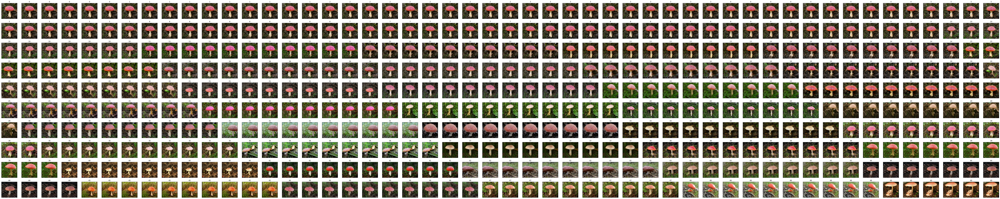

In [24]:
result = []
for i in range(len(factors)):
    image = generate_images(classes_vector[i], noise_vector[i], factors[i])
    result.append(image)
result = np.concatenate(result)

plot_strided_grid(result, samples_count, factors_count)

# Task 5 (20 marks)

Wow, so many mushrooms. 

This has been an amazing adventure, let's make some conclusions.
Here are some questions that you should answer, but also feel free to add any other thoughts that you have:
1. What's the relationship between truncation and image diversity?

答：从结果可以看到，当truncation越小图片多样性越少，越大则多样性越大。

2. What's the relationship between truncation and image quality?

答：从结果可以看到，当truncation越小图片的质量越好，越大甚至导致出现奇怪的样本。

3. Have you seen any extremely unusual samples in the batch?

答：有，比较随机，生成的样本类似于下面这种。
<img src="./images/a.png" style="display: block; margin: 0 auto; width: 500px; height: auto"/>

4. Why is truncation affecting the batch in this way?

答：truncation提供了图像质量或保真度与图像多样性之间的权衡。本质是通过以大于选定阈值的幅度来对值进行重采样来截断z向量，从而以降低总体样本种类为代价来提高单个样本的质量。采样范围越窄，质量越好，而采样范围越大，采样图像的多样性就越大。
 
If it's not quite clear what to make out of the 50 images, re-run the procedure with a different seed / more truncation factors to see the trend. Repeat until a pattern starts to emerge. If you have created the noise vectors as required, you should see the pattern within 2-3 batches.

Write your answer in this markdown cell.